# Evaluate YCSB Result

<img src="https://raw.githubusercontent.com/Beuth-Erdelt/Benchmark-Experiment-Host-Manager/master/docs/workflow-sketch-simple.png"/>

References:
1. https://github.com/brianfrankcooper/YCSB/wiki/Running-a-Workload

## Import Packages

In [1]:
%matplotlib inline

import pandas as pd
import os
import re
import matplotlib.pyplot as plt
import pickle
# Some nice output
pd.set_option("display.max_rows", None)
pd.set_option('display.max_colwidth', None)
from IPython.display import display, Markdown

import evaluator

## Pick Result

In [2]:
code = "1684707152"
path = "./"
name_pattern = "PostgreSQL-32-(.+?)-(.+?)-1"
peak_benchmark = 114688#98304#81920

## Helper Functions

In [3]:
def plot_comparison(df_aggregated, x, y, colum, title, marker=None):
    if y in df_aggregated.columns:
        ax = evaluation.plot(df_aggregated.rename(columns={'pod_count': 'pods'}), column=column, x=x, y=y, figsize=(2,2))
        ax.title.set_size(10)
        ax.set_title(title)
        plt.legend(loc='lower right', title='num pods')
        if marker is not None:
            ax.axvline(marker, color='k', linestyle='--')
        return ax
    else:
        print("{} not avalable".format(y))

def plot_variation(df_groups, max_pod_count, column):
    if column in df_groups:
        ax = df_groups[df_groups['pod_count']==max_pod_count].boxplot(by='target', column=column, rot=90, figsize=(2,2), grid=False)
        ax.get_figure().suptitle('')
        ax.title.set_size(10)
    else:
        print("{} not avalable".format(column))

def plot_metric(df, title, marker=None):
    global name_pattern
    df = pd.DataFrame(df, columns=["new"])
    #found = re.findall('PostgreSQL-AWS-32-(.+?)-(.+?)-1\n', stdout)
    #print(found)
    #df['vusers'] = 
    #print(name_pattern)
    #print(df)
    liste = list(df.index.map(lambda x: re.findall(name_pattern, x)))
    #print(liste)
    df['pods'] = [int(x[0][0]) for x in liste]
    df['target'] = [int(int(x[0][1])) for x in liste]
    #df['target'] = [int(int(x[0][1])/16384) for x in liste]
    #df['config'] = [x[0] for x in liste]
    #df.set_index('vusers', inplace=True)
    #ax = df.plot.bar(legend=False, figsize=(2,2), title="SUT CPU")
    #df.plot.bar(x='target')
    df = df.pivot(columns='pods', index='target', values='new')
    ax = df.plot(figsize=(2,2), title=title)
    plt.legend(title='num pods')
    ax.set_ylim(0, df.max().max()*1.05)
    ax.title.set_size(10)
    if marker is not None:
        ax.axvline(marker, color='k', linestyle='--')
    return ax


## Start Evaluation

In [4]:
evaluation = evaluator.ycsb(code=code, path=path)

# Prepare Result

This has to be done only once. Prepared results will be stored in result folder.

## Transform all Benchmarking Log Files to DataFrames

We also pick the first log file to be an example for later

In [5]:
filename_example = ""

directory = os.fsencode(path+"/"+code)
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    if filename.startswith("bexhoma-benchmarker") and filename.endswith(".log"):
        #print("filename:", filename)
        pod_name = filename[filename.rindex("-")+1:-len(".log")]
        #print("pod_name:", pod_name)
        jobname = filename[len("bexhoma-benchmarker-"):-len("-"+pod_name+".log")]
        print("jobname:", jobname)
        evaluation.end_benchmarking(jobname)
        filename_example = filename

jobname: postgresql-32-1-114688-1684707152-1-1
jobname: postgresql-32-1-131072-1684707152-1-1
jobname: postgresql-32-1-147456-1684707152-1-1
jobname: postgresql-32-1-163840-1684707152-1-1
jobname: postgresql-32-1-180224-1684707152-1-1
jobname: postgresql-32-1-196608-1684707152-1-1
jobname: postgresql-32-1-65536-1684707152-1-1
jobname: postgresql-32-1-81920-1684707152-1-1
jobname: postgresql-32-1-98304-1684707152-1-1
jobname: postgresql-32-8-114688-1684707152-1-1
jobname: postgresql-32-8-114688-1684707152-1-1
jobname: postgresql-32-8-114688-1684707152-1-1
jobname: postgresql-32-8-114688-1684707152-1-1
jobname: postgresql-32-8-114688-1684707152-1-1
jobname: postgresql-32-8-114688-1684707152-1-1
jobname: postgresql-32-8-114688-1684707152-1-1
jobname: postgresql-32-8-114688-1684707152-1-1
jobname: postgresql-32-8-131072-1684707152-1-1
jobname: postgresql-32-8-131072-1684707152-1-1
jobname: postgresql-32-8-131072-1684707152-1-1
jobname: postgresql-32-8-131072-1684707152-1-1
jobname: postgre

### Show a DataFrame for Single Pod as Example

In [6]:
filename = path+"/"+code+"/"+filename_example+".df.pickle"
print(filename)
df = pd.read_pickle(filename)
df

.//1684707152/bexhoma-benchmarker-postgresql-32-8-98304-1684707152-1-1-xcnhw.log.df.pickle


,connection,configuration,experiment_run,client,pod,pod_count,threads,target,sf,workload,...,[READ].MaxLatency(us),[READ].95thPercentileLatency(us),[READ].99thPercentileLatency(us),[READ].Return=OK,[CLEANUP].Operations,[CLEANUP].AverageLatency(us),[CLEANUP].MinLatency(us),[CLEANUP].MaxLatency(us),[CLEANUP].95thPercentileLatency(us),[CLEANUP].99thPercentileLatency(us)
PostgreSQL-32-8-98304-1,,,,,,,,,,,,,,,,,,,,,
0,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304,1,1,xcnhw,8,4,12288,30,c,...,118399,611,1093,3750000,4,198.0,100,392,392,392


## Transform all Loading Log Files to DataFrames

We also pick the first log file to be an example for later

In [7]:
directory = os.fsencode(path+"/"+code)
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    if filename.startswith("bexhoma-loading") and filename.endswith(".sensor.log"):
        #print("filename:", filename)
        pod_name = filename[filename.rindex("-")+1:-len(".log")]
        #print("pod_name:", pod_name)
        jobname = filename[len("bexhoma-loading-"):-len("-"+pod_name+".sensor.log")]
        #print("jobname:", jobname)
        evaluation.end_loading(jobname)

### Show a DataFrame for Single Pod as Example

In [8]:
filename = path+"/"+code+"/"+filename_example+".df.pickle"
print(filename)
df = pd.read_pickle(filename)
df

.//1684707152/bexhoma-benchmarker-postgresql-32-8-98304-1684707152-1-1-xcnhw.log.df.pickle


,connection,configuration,experiment_run,client,pod,pod_count,threads,target,sf,workload,...,[READ].MaxLatency(us),[READ].95thPercentileLatency(us),[READ].99thPercentileLatency(us),[READ].Return=OK,[CLEANUP].Operations,[CLEANUP].AverageLatency(us),[CLEANUP].MinLatency(us),[CLEANUP].MaxLatency(us),[CLEANUP].95thPercentileLatency(us),[CLEANUP].99thPercentileLatency(us)
PostgreSQL-32-8-98304-1,,,,,,,,,,,,,,,,,,,,,
0,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304,1,1,xcnhw,8,4,12288,30,c,...,118399,611,1093,3750000,4,198.0,100,392,392,392


## Transform all DataFrames into Single Result DataFrame

In [9]:
evaluation.evaluate_results()

# Get Loading Result

In [10]:
df = evaluation.get_df_loading()

df = df.sort_values(['configuration','experiment_run','client'])

df = df[df.columns.drop(list(df.filter(regex='FAILED')))]

df.T

connection_pod,PostgreSQL-32-1-114688-1,PostgreSQL-32-1-131072-1,PostgreSQL-32-1-147456-1,PostgreSQL-32-1-163840-1,PostgreSQL-32-1-180224-1,PostgreSQL-32-1-196608-1,PostgreSQL-32-1-65536-1,PostgreSQL-32-1-81920-1,PostgreSQL-32-1-98304-1,PostgreSQL-32-8-114688-1,...,PostgreSQL-32-8-81920-7,PostgreSQL-32-8-81920-8,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304-2,PostgreSQL-32-8-98304-3,PostgreSQL-32-8-98304-4,PostgreSQL-32-8-98304-5,PostgreSQL-32-8-98304-6,PostgreSQL-32-8-98304-7,PostgreSQL-32-8-98304-8
connection,PostgreSQL-32-1-114688,PostgreSQL-32-1-131072,PostgreSQL-32-1-147456,PostgreSQL-32-1-163840,PostgreSQL-32-1-180224,PostgreSQL-32-1-196608,PostgreSQL-32-1-65536,PostgreSQL-32-1-81920,PostgreSQL-32-1-98304,PostgreSQL-32-8-114688,...,PostgreSQL-32-8-81920,PostgreSQL-32-8-81920,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304
configuration,PostgreSQL-32-1-114688,PostgreSQL-32-1-131072,PostgreSQL-32-1-147456,PostgreSQL-32-1-163840,PostgreSQL-32-1-180224,PostgreSQL-32-1-196608,PostgreSQL-32-1-65536,PostgreSQL-32-1-81920,PostgreSQL-32-1-98304,PostgreSQL-32-8-114688,...,PostgreSQL-32-8-81920,PostgreSQL-32-8-81920,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304
experiment_run,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
client,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
pod,5wrmz.sensor,pwzb2.sensor,9rhzf.sensor,s77xk.sensor,jx5vv.sensor,qzrbp.sensor,6hh47.sensor,6hh46.sensor,nb8n9.sensor,2spcr.sensor,...,mpk2f.sensor,xfw4z.sensor,2x42q.sensor,5xxwg.sensor,cj2gj.sensor,gjvqc.sensor,hkgts.sensor,hq5hv.sensor,s8t25.sensor,wf48q.sensor
pod_count,1,1,1,1,1,1,1,1,1,8,...,8,8,8,8,8,8,8,8,8,8
threads,32,32,32,32,32,32,32,32,32,4,...,4,4,4,4,4,4,4,4,4,4
target,114688,131072,147456,163840,180224,196608,65536,81920,98304,14336,...,10240,10240,12288,12288,12288,12288,12288,12288,12288,12288
sf,30,30,30,30,30,30,30,30,30,30,...,30,30,30,30,30,30,30,30,30,30
workload,c,c,c,c,c,c,c,c,c,c,...,c,c,c,c,c,c,c,c,c,c


## Plot Results

### Set Data Types for Plotting

In [11]:
df.fillna(0, inplace=True)

df_plot = evaluation.loading_set_datatypes(df)

df_plot.sort_values('target', inplace=True)

### Remove Failed Pods

In [12]:
df_plot.drop(df_plot[df_plot['[OVERALL].Throughput(ops/sec)'] == 0].index, inplace=True)

df_plot.T

connection_pod,PostgreSQL-32-8-65536-1,PostgreSQL-32-8-65536-8,PostgreSQL-32-8-65536-7,PostgreSQL-32-8-65536-6,PostgreSQL-32-8-65536-2,PostgreSQL-32-8-65536-4,PostgreSQL-32-8-65536-3,PostgreSQL-32-8-65536-5,PostgreSQL-32-8-81920-8,PostgreSQL-32-8-81920-6,...,PostgreSQL-32-8-196608-8,PostgreSQL-32-1-65536-1,PostgreSQL-32-1-81920-1,PostgreSQL-32-1-98304-1,PostgreSQL-32-1-114688-1,PostgreSQL-32-1-131072-1,PostgreSQL-32-1-147456-1,PostgreSQL-32-1-163840-1,PostgreSQL-32-1-180224-1,PostgreSQL-32-1-196608-1
connection,PostgreSQL-32-8-65536,PostgreSQL-32-8-65536,PostgreSQL-32-8-65536,PostgreSQL-32-8-65536,PostgreSQL-32-8-65536,PostgreSQL-32-8-65536,PostgreSQL-32-8-65536,PostgreSQL-32-8-65536,PostgreSQL-32-8-81920,PostgreSQL-32-8-81920,...,PostgreSQL-32-8-196608,PostgreSQL-32-1-65536,PostgreSQL-32-1-81920,PostgreSQL-32-1-98304,PostgreSQL-32-1-114688,PostgreSQL-32-1-131072,PostgreSQL-32-1-147456,PostgreSQL-32-1-163840,PostgreSQL-32-1-180224,PostgreSQL-32-1-196608
configuration,PostgreSQL-32-8-65536,PostgreSQL-32-8-65536,PostgreSQL-32-8-65536,PostgreSQL-32-8-65536,PostgreSQL-32-8-65536,PostgreSQL-32-8-65536,PostgreSQL-32-8-65536,PostgreSQL-32-8-65536,PostgreSQL-32-8-81920,PostgreSQL-32-8-81920,...,PostgreSQL-32-8-196608,PostgreSQL-32-1-65536,PostgreSQL-32-1-81920,PostgreSQL-32-1-98304,PostgreSQL-32-1-114688,PostgreSQL-32-1-131072,PostgreSQL-32-1-147456,PostgreSQL-32-1-163840,PostgreSQL-32-1-180224,PostgreSQL-32-1-196608
experiment_run,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
client,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
pod,5ckdm.sensor,zt7dn.sensor,zjcbc.sensor,vtwdc.sensor,dcp6x.sensor,sxtw6.sensor,r5hqw.sensor,t76bk.sensor,xfw4z.sensor,j9tlz.sensor,...,vtlnk.sensor,6hh47.sensor,6hh46.sensor,nb8n9.sensor,5wrmz.sensor,pwzb2.sensor,9rhzf.sensor,s77xk.sensor,jx5vv.sensor,qzrbp.sensor
pod_count,8,8,8,8,8,8,8,8,8,8,...,8,1,1,1,1,1,1,1,1,1
threads,4,4,4,4,4,4,4,4,4,4,...,4,32,32,32,32,32,32,32,32,32
target,8192,8192,8192,8192,8192,8192,8192,8192,10240,10240,...,24576,65536,81920,98304,114688,131072,147456,163840,180224,196608
sf,30,30,30,30,30,30,30,30,30,30,...,30,30,30,30,30,30,30,30,30,30
workload,c,c,c,c,c,c,c,c,c,c,...,c,c,c,c,c,c,c,c,c,c


### Plot Results per Number of Pods

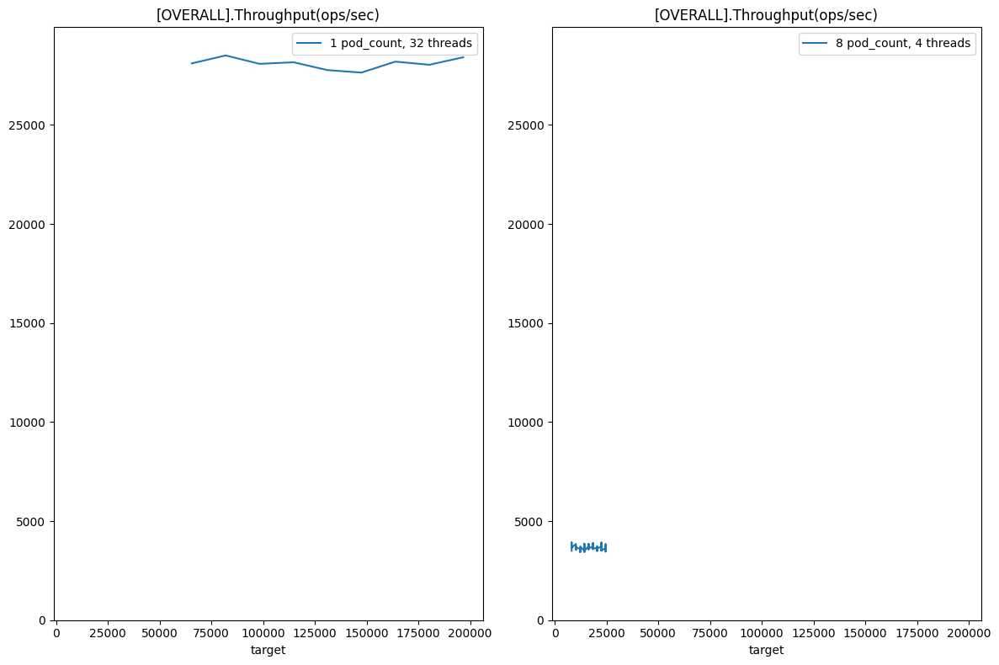

In [13]:
%matplotlib inline

column = "threads"
x = "target"
y = "[OVERALL].Throughput(ops/sec)"
evaluation.plot(df_plot, column=column, x=x, y=y, plot_by="pod_count")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


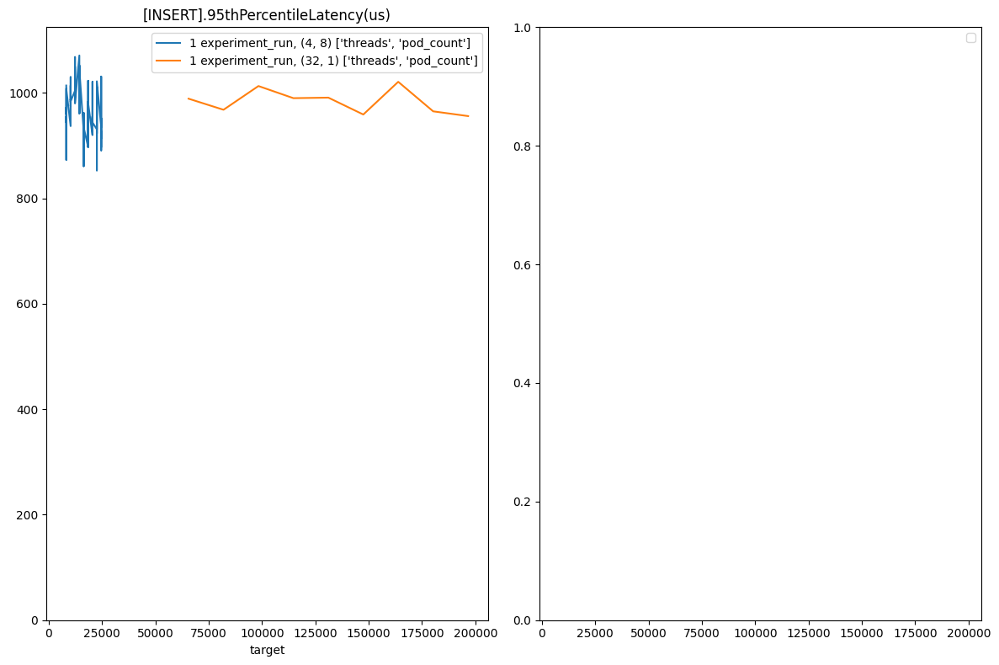

In [14]:
column = ["threads", "pod_count"]
x = "target"
y = "[INSERT].95thPercentileLatency(us)"
evaluation.plot(df_plot, column=column, x=x, y=y, plot_by="experiment_run")

## Aggregate by Parallel Pods

In [15]:
df = evaluation.get_df_loading()
df

,connection,configuration,experiment_run,client,pod,pod_count,threads,target,sf,workload,...,[CLEANUP].MaxLatency(us),[CLEANUP].95thPercentileLatency(us),[CLEANUP].99thPercentileLatency(us),[INSERT].Operations,[INSERT].AverageLatency(us),[INSERT].MinLatency(us),[INSERT].MaxLatency(us),[INSERT].95thPercentileLatency(us),[INSERT].99thPercentileLatency(us),[INSERT].Return=OK
connection_pod,,,,,,,,,,,,,,,,,,,,,
PostgreSQL-32-1-114688-1,PostgreSQL-32-1-114688,PostgreSQL-32-1-114688,1,0,5wrmz.sensor,1,32,114688,30,c,...,204,166,204,30000000,1037.3165664,629,21692415,990,1279,30000000
PostgreSQL-32-1-131072-1,PostgreSQL-32-1-131072,PostgreSQL-32-1-131072,1,0,pwzb2.sensor,1,32,131072,30,c,...,348,139,348,30000000,1042.6330155,627,22118399,991,1294,30000000
PostgreSQL-32-1-147456-1,PostgreSQL-32-1-147456,PostgreSQL-32-1-147456,1,0,9rhzf.sensor,1,32,147456,30,c,...,232,143,232,30000000,1042.7403679666666,630,23773183,959,1276,30000000
PostgreSQL-32-1-163840-1,PostgreSQL-32-1-163840,PostgreSQL-32-1-163840,1,0,s77xk.sensor,1,32,163840,30,c,...,188,137,188,30000000,1033.4374855666667,632,22315007,1021,1297,30000000
PostgreSQL-32-1-180224-1,PostgreSQL-32-1-180224,PostgreSQL-32-1-180224,1,0,jx5vv.sensor,1,32,180224,30,c,...,190,150,190,30000000,1042.0042096333334,631,23216127,965,1268,30000000
PostgreSQL-32-1-196608-1,PostgreSQL-32-1-196608,PostgreSQL-32-1-196608,1,0,qzrbp.sensor,1,32,196608,30,c,...,198,159,198,30000000,1042.1079765333334,629,23199743,956,1262,30000000
PostgreSQL-32-1-65536-1,PostgreSQL-32-1-65536,PostgreSQL-32-1-65536,1,0,6hh47.sensor,1,32,65536,30,c,...,206,137,206,30000000,1028.6626348666666,629,23609343,989,1270,30000000
PostgreSQL-32-1-81920-1,PostgreSQL-32-1-81920,PostgreSQL-32-1-81920,1,0,6hh46.sensor,1,32,81920,30,c,...,183,131,183,30000000,1033.6271950333332,629,23363583,968,1266,30000000
PostgreSQL-32-1-98304-1,PostgreSQL-32-1-98304,PostgreSQL-32-1-98304,1,0,nb8n9.sensor,1,32,98304,30,c,...,194,145,194,30000000,1044.4600505333333,635,23216127,1013,1284,30000000


In [16]:
df.fillna(0, inplace=True)
df_plot = evaluation.loading_set_datatypes(df)

df_aggregated = evaluation.loading_aggregate_by_parallel_pods(df_plot)
df_aggregated.sort_values('target', inplace=True)
df_aggregated.T

,PostgreSQL-32-8-65536,PostgreSQL-32-1-65536,PostgreSQL-32-8-81920,PostgreSQL-32-1-81920,PostgreSQL-32-1-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-114688,PostgreSQL-32-1-114688,PostgreSQL-32-8-131072,PostgreSQL-32-1-131072,PostgreSQL-32-1-147456,PostgreSQL-32-8-147456,PostgreSQL-32-1-163840,PostgreSQL-32-8-163840,PostgreSQL-32-1-180224,PostgreSQL-32-8-180224,PostgreSQL-32-8-196608,PostgreSQL-32-1-196608
connection,PostgreSQL-32-8-65536,PostgreSQL-32-1-65536,PostgreSQL-32-8-81920,PostgreSQL-32-1-81920,PostgreSQL-32-1-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-114688,PostgreSQL-32-1-114688,PostgreSQL-32-8-131072,PostgreSQL-32-1-131072,PostgreSQL-32-1-147456,PostgreSQL-32-8-147456,PostgreSQL-32-1-163840,PostgreSQL-32-8-163840,PostgreSQL-32-1-180224,PostgreSQL-32-8-180224,PostgreSQL-32-8-196608,PostgreSQL-32-1-196608
configuration,PostgreSQL-32-8-65536,PostgreSQL-32-1-65536,PostgreSQL-32-8-81920,PostgreSQL-32-1-81920,PostgreSQL-32-1-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-114688,PostgreSQL-32-1-114688,PostgreSQL-32-8-131072,PostgreSQL-32-1-131072,PostgreSQL-32-1-147456,PostgreSQL-32-8-147456,PostgreSQL-32-1-163840,PostgreSQL-32-8-163840,PostgreSQL-32-1-180224,PostgreSQL-32-8-180224,PostgreSQL-32-8-196608,PostgreSQL-32-1-196608
experiment_run,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
client,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
pod,5ckdm.sensordcp6x.sensorr5hqw.sensorsxtw6.sensort76bk.sensorvtwdc.sensorzjcbc.sensorzt7dn.sensor,6hh47.sensor,4rqzx.sensor6s6qg.sensor6sh67.sensor7nhvk.sensor9dgl7.sensorj9tlz.sensormpk2f.sensorxfw4z.sensor,6hh46.sensor,nb8n9.sensor,2x42q.sensor5xxwg.sensorcj2gj.sensorgjvqc.sensorhkgts.sensorhq5hv.sensors8t25.sensorwf48q.sensor,2spcr.sensor8985t.sensor97pff.sensord27jn.sensorlvmdt.sensormgzxq.sensorp79lf.sensorzqj9r.sensor,5wrmz.sensor,4mlzs.sensor5sn9s.sensor8jtlr.sensor8t52q.sensorks2cx.sensorll4jt.sensorp9qmx.sensorx7t84.sensor,pwzb2.sensor,9rhzf.sensor,24btm.sensor28s4p.sensor59dpw.sensor6956r.sensorcmbsm.sensorgmwqd.sensorgqw8g.sensorjjr94.sensor,s77xk.sensor,7ndtm.sensor8hvbq.sensorff69j.sensorh56cj.sensorv77vj.sensorwgck5.sensorwm5mm.sensorww7gf.sensor,jx5vv.sensor,4xht7.sensor9m7ns.sensorc9xh5.sensordjxsh.sensorl88wd.sensort9ss6.sensorvtcpc.sensorz46pv.sensor,b4cgp.sensorbp4ls.sensorcmdbd.sensordqsdr.sensork8qst.sensormbnfv.sensorq2xmt.sensorvtlnk.sensor,qzrbp.sensor
pod_count,8,1,8,1,1,8,8,1,8,1,1,8,1,8,1,8,8,1
threads,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32
target,65536,65536,81920,81920,98304,98304,114688,114688,131072,131072,147456,147456,163840,163840,180224,180224,196608,196608
sf,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30
workload,c,c,c,c,c,c,c,c,c,c,c,c,c,c,c,c,c,c


### Group by Connection

In [17]:
df_plot = evaluation.loading_set_datatypes(df)
df_groups = df_plot.groupby(['connection', 'pod'])

df_groups = df_groups.sum('target')
df_groups

,,experiment_run,client,pod_count,threads,target,sf,operations,batchsize,[OVERALL].RunTime(ms),[OVERALL].Throughput(ops/sec),...,[CLEANUP].MaxLatency(us),[CLEANUP].95thPercentileLatency(us),[CLEANUP].99thPercentileLatency(us),[INSERT].Operations,[INSERT].AverageLatency(us),[INSERT].MinLatency(us),[INSERT].MaxLatency(us),[INSERT].95thPercentileLatency(us),[INSERT].99thPercentileLatency(us),[INSERT].Return=OK
connection,pod,,,,,,,,,,,,,,,,,,,,,
PostgreSQL-32-1-114688,5wrmz.sensor,1,0,1,32,114688,30,30000000,-1,1065164.0,28164.676989,...,204.0,166.0,204.0,30000000,1037.316566,629.0,21692415.0,990.0,1279.0,30000000
PostgreSQL-32-1-131072,pwzb2.sensor,1,0,1,32,131072,30,30000000,-1,1080346.0,27768.881451,...,348.0,139.0,348.0,30000000,1042.633016,627.0,22118399.0,991.0,1294.0,30000000
PostgreSQL-32-1-147456,9rhzf.sensor,1,0,1,32,147456,30,30000000,-1,1085236.0,27643.756750,...,232.0,143.0,232.0,30000000,1042.740368,630.0,23773183.0,959.0,1276.0,30000000
PostgreSQL-32-1-163840,s77xk.sensor,1,0,1,32,163840,30,30000000,-1,1063922.0,28197.555836,...,188.0,137.0,188.0,30000000,1033.437486,632.0,22315007.0,1021.0,1297.0,30000000
PostgreSQL-32-1-180224,jx5vv.sensor,1,0,1,32,180224,30,30000000,-1,1069972.0,28038.116885,...,190.0,150.0,190.0,30000000,1042.004210,631.0,23216127.0,965.0,1268.0,30000000
PostgreSQL-32-1-196608,qzrbp.sensor,1,0,1,32,196608,30,30000000,-1,1055705.0,28417.029378,...,198.0,159.0,198.0,30000000,1042.107977,629.0,23199743.0,956.0,1262.0,30000000
PostgreSQL-32-1-65536,6hh47.sensor,1,0,1,32,65536,30,30000000,-1,1067286.0,28108.679398,...,206.0,137.0,206.0,30000000,1028.662635,629.0,23609343.0,989.0,1270.0,30000000
PostgreSQL-32-1-81920,6hh46.sensor,1,0,1,32,81920,30,30000000,-1,1052304.0,28508.871961,...,183.0,131.0,183.0,30000000,1033.627195,629.0,23363583.0,968.0,1266.0,30000000
PostgreSQL-32-1-98304,nb8n9.sensor,1,0,1,32,98304,30,30000000,-1,1068204.0,28084.523181,...,194.0,145.0,194.0,30000000,1044.460051,635.0,23216127.0,1013.0,1284.0,30000000


### Get Maximum Number of Parallel Pods

In [18]:
max_pod_count = df_groups['pod_count'].max()
max_pod_count

8

### Plot Varations

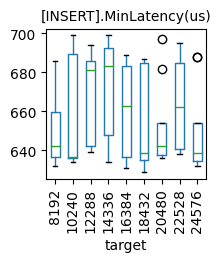

In [19]:
y='[INSERT].MinLatency(us)'
plot_variation(df_groups, max_pod_count, y)

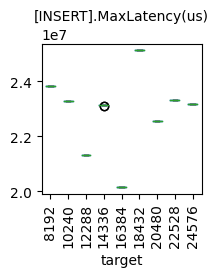

In [20]:
y='[INSERT].MaxLatency(us)'
plot_variation(df_groups, max_pod_count, y)

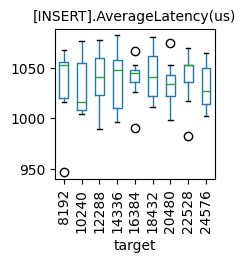

In [21]:
y='[INSERT].AverageLatency(us)'
plot_variation(df_groups, max_pod_count, y)

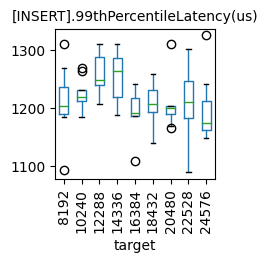

In [22]:
y='[INSERT].99thPercentileLatency(us)'
plot_variation(df_groups, max_pod_count, y)

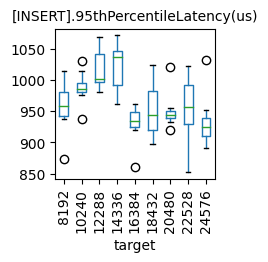

In [23]:
y='[INSERT].95thPercentileLatency(us)'
plot_variation(df_groups, max_pod_count, y)

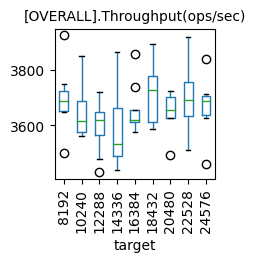

In [24]:
y='[OVERALL].Throughput(ops/sec)'
plot_variation(df_groups, max_pod_count, y)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


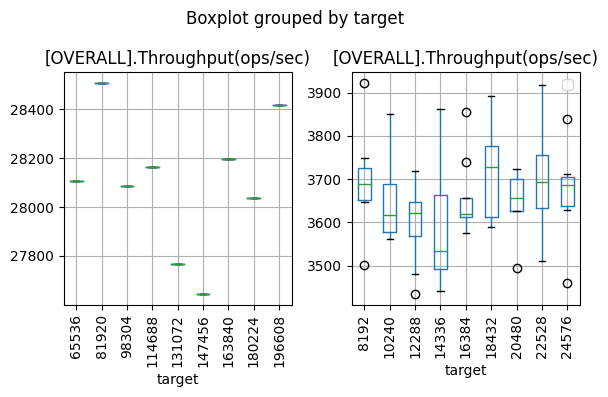

In [25]:
by='target'
column='[OVERALL].Throughput(ops/sec)'
groups = df_groups.groupby('pod_count')
rows = 1#(len(groups)+1)//2
row=0
col=0
fig, axes = plt.subplots(nrows=rows, ncols=2, squeeze=False, figsize=(6,4*rows))#, sharex=True
for key1, grp in groups:#df3.groupby(col1):
    ax = grp.boxplot(ax=axes[row,col], by='target', column='[OVERALL].Throughput(ops/sec)', figsize=(6,4), layout=(rows,2), rot=90)
    col = col + 1
    if col > 1:
        row = row + 1
        col = 0
plt.legend(loc='best')
plt.tight_layout()
plt.show()


### Plot Comparison

<AxesSubplot: title={'center': 'Throughput [ops/s]'}, xlabel='target'>

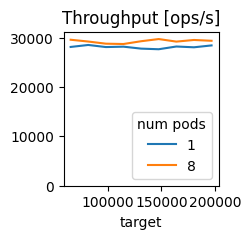

In [26]:
column = "pods"
x = "target"
y = "[OVERALL].Throughput(ops/sec)"
title = "Throughput [ops/s]"
plot_comparison(df_aggregated, x, y, column, title)

<AxesSubplot: title={'center': 'Avg Lat [$\\mu$s]'}, xlabel='target'>

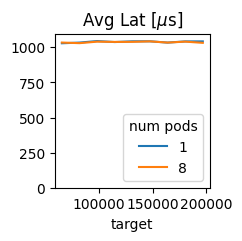

In [27]:
column = "pods"
x = "target"
y = "[INSERT].AverageLatency(us)"
title = "Avg Lat [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title)

<AxesSubplot: title={'center': '95th Lat [$\\mu$s]'}, xlabel='target'>

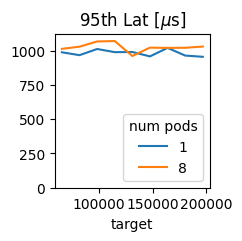

In [28]:
column = "pods"
x = "target"
y = "[INSERT].95thPercentileLatency(us)"
title = "95th Lat [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title)

<AxesSubplot: title={'center': '99th Lat [$\\mu$s]'}, xlabel='target'>

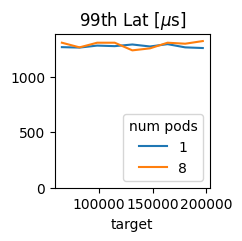

In [29]:
column = "pods"
x = "target"
y = "[INSERT].99thPercentileLatency(us)"
title = "99th Lat [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title)

<AxesSubplot: title={'center': 'Max Lat [ms]'}, xlabel='target'>

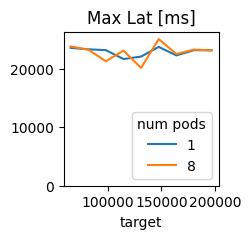

In [30]:
column = "pods"
x = "target"
y = "[INSERT].MaxLatency(us)"
y2 = "[INSERT].MaxLatency(ms)"
title = "Max Lat [ms]"
df_aggregated[y2] = df_aggregated[y]/1000.
plot_comparison(df_aggregated, x, y2, column, title)

<AxesSubplot: title={'center': 'Min Lat [$\\mu$s]'}, xlabel='target'>

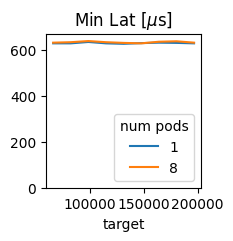

In [31]:
column = "pods"
x = "target"
y = "[INSERT].MinLatency(us)"
title = "Min Lat [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title)

# Get Benchmarking Result

In [32]:
df = evaluation.get_df_benchmarking()
#df = df[df.columns.drop(list(df.filter(regex='FAILED')))]
df.T

connection_pod,PostgreSQL-32-1-114688-1-1,PostgreSQL-32-1-131072-1-1,PostgreSQL-32-1-147456-1-1,PostgreSQL-32-1-163840-1-1,PostgreSQL-32-1-180224-1-1,PostgreSQL-32-1-196608-1-1,PostgreSQL-32-1-65536-1-1,PostgreSQL-32-1-81920-1-1,PostgreSQL-32-1-98304-1-1,PostgreSQL-32-8-114688-1-1,...,PostgreSQL-32-8-81920-1-7,PostgreSQL-32-8-81920-1-8,PostgreSQL-32-8-98304-1-1,PostgreSQL-32-8-98304-1-2,PostgreSQL-32-8-98304-1-3,PostgreSQL-32-8-98304-1-4,PostgreSQL-32-8-98304-1-5,PostgreSQL-32-8-98304-1-6,PostgreSQL-32-8-98304-1-7,PostgreSQL-32-8-98304-1-8
connection,PostgreSQL-32-1-114688-1,PostgreSQL-32-1-131072-1,PostgreSQL-32-1-147456-1,PostgreSQL-32-1-163840-1,PostgreSQL-32-1-180224-1,PostgreSQL-32-1-196608-1,PostgreSQL-32-1-65536-1,PostgreSQL-32-1-81920-1,PostgreSQL-32-1-98304-1,PostgreSQL-32-8-114688-1,...,PostgreSQL-32-8-81920-1,PostgreSQL-32-8-81920-1,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-98304-1
configuration,PostgreSQL-32-1-114688,PostgreSQL-32-1-131072,PostgreSQL-32-1-147456,PostgreSQL-32-1-163840,PostgreSQL-32-1-180224,PostgreSQL-32-1-196608,PostgreSQL-32-1-65536,PostgreSQL-32-1-81920,PostgreSQL-32-1-98304,PostgreSQL-32-8-114688,...,PostgreSQL-32-8-81920,PostgreSQL-32-8-81920,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-98304
experiment_run,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
client,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
pod,q9hsv,fbjrb,nws5r,cg2qx,sgc56,l2jfw,hq4zh,n5f6l,7gwfd,5mc98,...,q658b,z8zmp,29gsv,77r4d,g2zvk,j45t4,srjlw,tpfhl,vjhxg,xcnhw
pod_count,1,1,1,1,1,1,1,1,1,8,...,8,8,8,8,8,8,8,8,8,8
threads,32,32,32,32,32,32,32,32,32,4,...,4,4,4,4,4,4,4,4,4,4
target,114688,131072,147456,163840,180224,196608,65536,81920,98304,14336,...,10240,10240,12288,12288,12288,12288,12288,12288,12288,12288
sf,30,30,30,30,30,30,30,30,30,30,...,30,30,30,30,30,30,30,30,30,30
workload,c,c,c,c,c,c,c,c,c,c,...,c,c,c,c,c,c,c,c,c,c


## Reconstruct Workflow out of Result

How many benchmarker have been used per configuration?

In [33]:
evaluation.reconstruct_workflow(df)

{'PostgreSQL-32-1-114688': [[1]],
 'PostgreSQL-32-1-131072': [[1]],
 'PostgreSQL-32-1-147456': [[1]],
 'PostgreSQL-32-1-163840': [[1]],
 'PostgreSQL-32-1-180224': [[1]],
 'PostgreSQL-32-1-196608': [[1]],
 'PostgreSQL-32-1-65536': [[1]],
 'PostgreSQL-32-1-81920': [[1]],
 'PostgreSQL-32-1-98304': [[1]],
 'PostgreSQL-32-8-114688': [[8]],
 'PostgreSQL-32-8-131072': [[8]],
 'PostgreSQL-32-8-147456': [[8]],
 'PostgreSQL-32-8-163840': [[8]],
 'PostgreSQL-32-8-180224': [[8]],
 'PostgreSQL-32-8-196608': [[8]],
 'PostgreSQL-32-8-65536': [[8]],
 'PostgreSQL-32-8-81920': [[8]],
 'PostgreSQL-32-8-98304': [[8]]}

## Plot Results

### Set Data Types for Plotting

In [34]:
df.fillna(0, inplace=True)
#df.drop(df[df['[READ].Operations'] == 0].index, inplace=True)
#df.drop(df[df['[READ].Return=OK'] == 0].index, inplace=True)

df_plot = evaluation.benchmarking_set_datatypes(df)
df_plot.sort_values('target', inplace=True)
df_plot

,connection,configuration,experiment_run,client,pod,pod_count,threads,target,sf,workload,...,[READ].MaxLatency(us),[READ].95thPercentileLatency(us),[READ].99thPercentileLatency(us),[READ].Return=OK,[CLEANUP].Operations,[CLEANUP].AverageLatency(us),[CLEANUP].MinLatency(us),[CLEANUP].MaxLatency(us),[CLEANUP].95thPercentileLatency(us),[CLEANUP].99thPercentileLatency(us)
connection_pod,,,,,,,,,,,,,,,,,,,,,
PostgreSQL-32-8-65536-1-1,PostgreSQL-32-8-65536-1,PostgreSQL-32-8-65536,1,1,6fqmc,8,4,8192,30,c,...,126399.0,625.0,1025.0,3750000,4,364.75000,69.0,748.0,748.0,748.0
PostgreSQL-32-8-65536-1-8,PostgreSQL-32-8-65536-1,PostgreSQL-32-8-65536,1,1,zvcvv,8,4,8192,30,c,...,111487.0,520.0,1055.0,3750000,4,172.75000,79.0,401.0,401.0,401.0
PostgreSQL-32-8-65536-1-7,PostgreSQL-32-8-65536-1,PostgreSQL-32-8-65536,1,1,tzdlk,8,4,8192,30,c,...,164863.0,558.0,880.0,3750000,4,289.50000,75.0,470.0,470.0,470.0
PostgreSQL-32-8-65536-1-6,PostgreSQL-32-8-65536-1,PostgreSQL-32-8-65536,1,1,pssvq,8,4,8192,30,c,...,139135.0,566.0,1235.0,3750000,4,153.75000,59.0,422.0,422.0,422.0
PostgreSQL-32-8-65536-1-2,PostgreSQL-32-8-65536-1,PostgreSQL-32-8-65536,1,1,6rtzr,8,4,8192,30,c,...,282623.0,513.0,993.0,3750000,4,118.50000,49.0,315.0,315.0,315.0
PostgreSQL-32-8-65536-1-4,PostgreSQL-32-8-65536-1,PostgreSQL-32-8-65536,1,1,bw2zp,8,4,8192,30,c,...,189311.0,538.0,857.0,3750000,4,143.25000,54.0,351.0,351.0,351.0
PostgreSQL-32-8-65536-1-3,PostgreSQL-32-8-65536-1,PostgreSQL-32-8-65536,1,1,7hh2w,8,4,8192,30,c,...,223487.0,509.0,864.0,3750000,4,168.25000,87.0,366.0,366.0,366.0
PostgreSQL-32-8-65536-1-5,PostgreSQL-32-8-65536-1,PostgreSQL-32-8-65536,1,1,l7cjt,8,4,8192,30,c,...,121919.0,509.0,1079.0,3750000,4,139.50000,63.0,361.0,361.0,361.0
PostgreSQL-32-8-81920-1-8,PostgreSQL-32-8-81920-1,PostgreSQL-32-8-81920,1,1,z8zmp,8,4,10240,30,c,...,145919.0,644.0,1024.0,3750000,4,156.25000,51.0,395.0,395.0,395.0


### Plot Results per Number of Pods

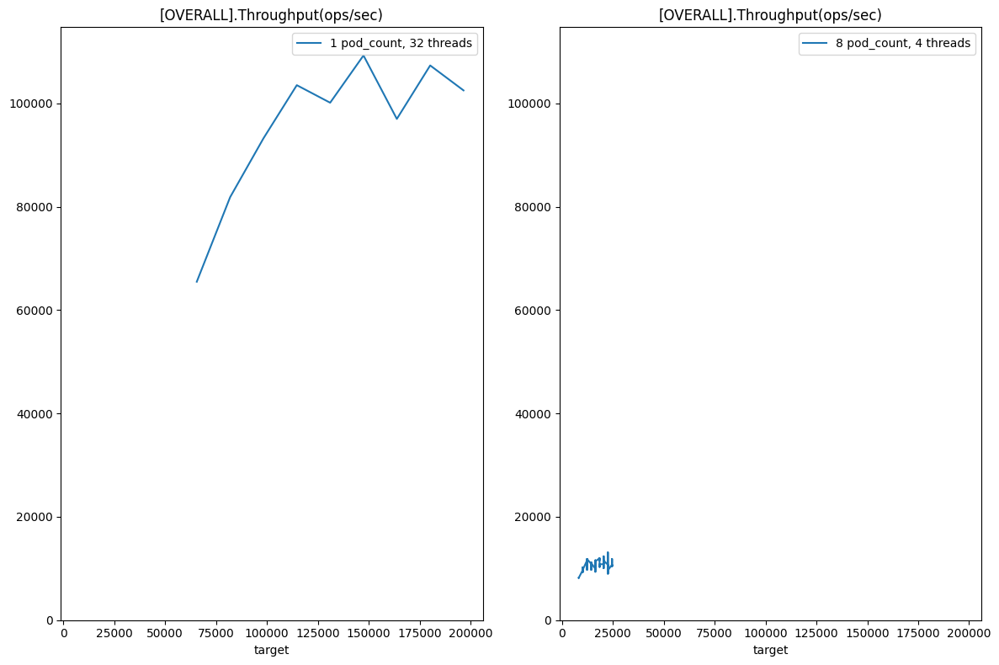

In [35]:
%matplotlib inline

column = "threads"
x = "target"
y = "[OVERALL].Throughput(ops/sec)"
evaluation.plot(df_plot, column=column, x=x, y=y, plot_by="pod_count")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


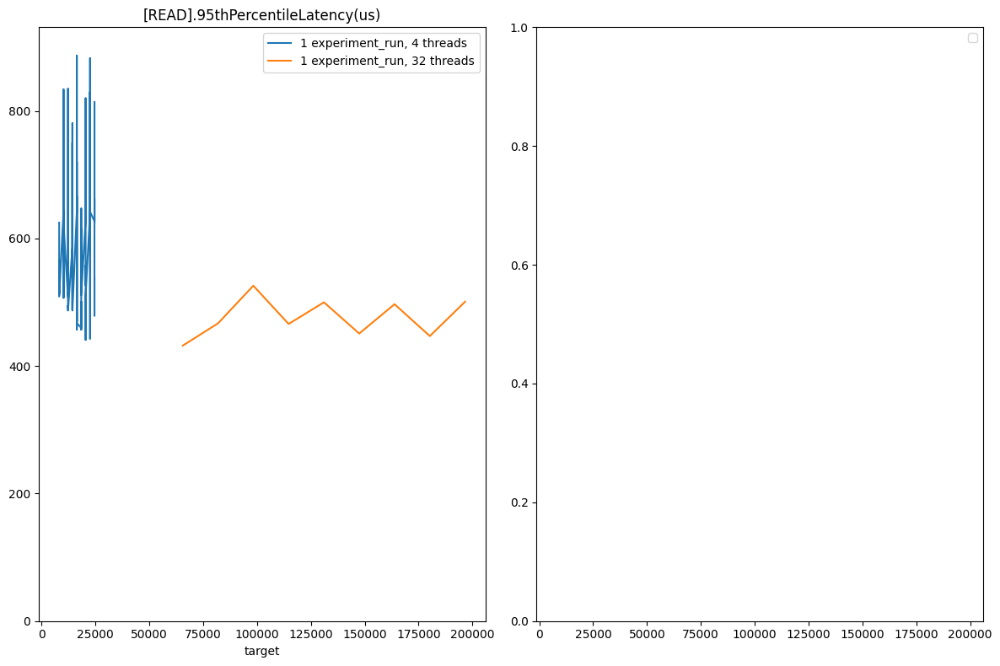

In [36]:
column = "threads"
x = "target"
y = "[READ].95thPercentileLatency(us)"
if y in df_plot.columns:
    evaluation.plot(df_plot, column=column, x=x, y=y, plot_by="experiment_run")

## Aggregate by Parallel Pods

In [37]:
df = evaluation.get_df_benchmarking()
df.fillna(0, inplace=True)
#df.drop(df[df['[READ].Operations'] == 0].index, inplace=True)
#df.drop(df[df['[READ].Return=OK'] == 0].index, inplace=True)
df_plot = evaluation.benchmarking_set_datatypes(df)
df_aggregated = evaluation.benchmarking_aggregate_by_parallel_pods(df_plot)
df_aggregated.sort_values('target', inplace=True)
df_aggregated.T

,PostgreSQL-32-8-65536-1,PostgreSQL-32-1-65536-1,PostgreSQL-32-8-81920-1,PostgreSQL-32-1-81920-1,PostgreSQL-32-1-98304-1,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-114688-1,PostgreSQL-32-1-114688-1,PostgreSQL-32-8-131072-1,PostgreSQL-32-1-131072-1,PostgreSQL-32-1-147456-1,PostgreSQL-32-8-147456-1,PostgreSQL-32-1-163840-1,PostgreSQL-32-8-163840-1,PostgreSQL-32-1-180224-1,PostgreSQL-32-8-180224-1,PostgreSQL-32-8-196608-1,PostgreSQL-32-1-196608-1
connection,PostgreSQL-32-8-65536-1,PostgreSQL-32-1-65536-1,PostgreSQL-32-8-81920-1,PostgreSQL-32-1-81920-1,PostgreSQL-32-1-98304-1,PostgreSQL-32-8-98304-1,PostgreSQL-32-8-114688-1,PostgreSQL-32-1-114688-1,PostgreSQL-32-8-131072-1,PostgreSQL-32-1-131072-1,PostgreSQL-32-1-147456-1,PostgreSQL-32-8-147456-1,PostgreSQL-32-1-163840-1,PostgreSQL-32-8-163840-1,PostgreSQL-32-1-180224-1,PostgreSQL-32-8-180224-1,PostgreSQL-32-8-196608-1,PostgreSQL-32-1-196608-1
configuration,PostgreSQL-32-8-65536,PostgreSQL-32-1-65536,PostgreSQL-32-8-81920,PostgreSQL-32-1-81920,PostgreSQL-32-1-98304,PostgreSQL-32-8-98304,PostgreSQL-32-8-114688,PostgreSQL-32-1-114688,PostgreSQL-32-8-131072,PostgreSQL-32-1-131072,PostgreSQL-32-1-147456,PostgreSQL-32-8-147456,PostgreSQL-32-1-163840,PostgreSQL-32-8-163840,PostgreSQL-32-1-180224,PostgreSQL-32-8-180224,PostgreSQL-32-8-196608,PostgreSQL-32-1-196608
experiment_run,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
client,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
pod,6fqmc6rtzr7hh2wbw2zpl7cjtpssvqtzdlkzvcvv,hq4zh,7l56kcfg7td84bxfwfkkj8zpfmgsg7q658bz8zmp,n5f6l,7gwfd,29gsv77r4dg2zvkj45t4srjlwtpfhlvjhxgxcnhw,5mc986mvqd7srvlbxqjvjpt2lnsf8dqd7slwbgl7,q9hsv,4jl8rbzff8g547cgrbmkjjpcfl6z68vzxc5zz4hc,fbjrb,nws5r,5dsw672zj4bmjsbj9zxtmqvdxnm2tfz2ljvzvhvw,cg2qx,4vcp86cs7m9hnm4j6r8jkbqk5q45ctsrlhcv6qdt,sgc56,4rzgb54lbj62x6db8464dgskkdkvldfq6w8r8xvp,284q6687zt9ch78d8np9hf5zhjb22ftjjtgxsttv,l2jfw
pod_count,8,1,8,1,1,8,8,1,8,1,1,8,1,8,1,8,8,1
threads,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32
target,65536,65536,81920,81920,98304,98304,114688,114688,131072,131072,147456,147456,163840,163840,180224,180224,196608,196608
sf,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30
workload,c,c,c,c,c,c,c,c,c,c,c,c,c,c,c,c,c,c


### Group by Connection

In [38]:
df_plot = evaluation.benchmarking_set_datatypes(df)
df_groups = df_plot.groupby(['connection', 'pod'])

df_groups = df_groups.sum('target')
df_groups

,,experiment_run,client,pod_count,threads,target,sf,operations,batchsize,[OVERALL].RunTime(ms),[OVERALL].Throughput(ops/sec),...,[READ].MaxLatency(us),[READ].95thPercentileLatency(us),[READ].99thPercentileLatency(us),[READ].Return=OK,[CLEANUP].Operations,[CLEANUP].AverageLatency(us),[CLEANUP].MinLatency(us),[CLEANUP].MaxLatency(us),[CLEANUP].95thPercentileLatency(us),[CLEANUP].99thPercentileLatency(us)
connection,pod,,,,,,,,,,,,,,,,,,,,,
PostgreSQL-32-1-114688-1,q9hsv,1,1,1,32,114688,30,30000000,-1,289707.0,103552.899999,...,99711.0,466.0,748.0,30000000,32,290.78125,52.0,6311.0,158.0,6311.0
PostgreSQL-32-1-131072-1,fbjrb,1,1,1,32,131072,30,30000000,-1,299528.0,100157.581261,...,101439.0,500.0,842.0,30000000,32,102.75000,66.0,335.0,129.0,335.0
PostgreSQL-32-1-147456-1,nws5r,1,1,1,32,147456,30,30000000,-1,274462.0,109304.748927,...,119295.0,451.0,721.0,30000000,32,120.00000,67.0,377.0,210.0,377.0
PostgreSQL-32-1-163840-1,cg2qx,1,1,1,32,163840,30,30000000,-1,309213.0,97020.500432,...,106111.0,497.0,1805.0,30000000,32,116.25000,74.0,335.0,178.0,335.0
PostgreSQL-32-1-180224-1,sgc56,1,1,1,32,180224,30,30000000,-1,279404.0,107371.404847,...,147071.0,447.0,705.0,30000000,32,521.31250,68.0,9935.0,351.0,9935.0
PostgreSQL-32-1-196608-1,l2jfw,1,1,1,32,196608,30,30000000,-1,292567.0,102540.614628,...,134527.0,501.0,843.0,30000000,32,126.81250,70.0,819.0,164.0,819.0
PostgreSQL-32-1-65536-1,hq4zh,1,1,1,32,65536,30,30000000,-1,457996.0,65502.755483,...,73663.0,432.0,607.0,30000000,32,153.65625,39.0,1069.0,457.0,1069.0
PostgreSQL-32-1-81920-1,n5f6l,1,1,1,32,81920,30,30000000,-1,366446.0,81867.451139,...,135295.0,467.0,687.0,30000000,32,124.78125,39.0,1366.0,264.0,1366.0
PostgreSQL-32-1-98304-1,7gwfd,1,1,1,32,98304,30,30000000,-1,321673.0,93262.412450,...,129599.0,526.0,897.0,30000000,32,96.90625,43.0,574.0,133.0,574.0


### Get Maximum Number of Parallel Pods

In [39]:
max_pod_count = df_groups['pod_count'].max()
max_pod_count

8

### Plot Variations

#### Throughput

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


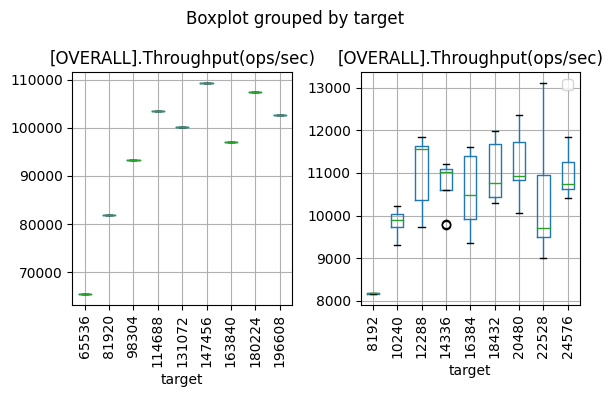

In [40]:
by='target'
column='[OVERALL].Throughput(ops/sec)'
groups = df_groups.groupby('pod_count')
#print(groups)
#print(len(groups))
rows = 1#(len(groups)+1)//2
#print(rows, "rows")
row=0
col=0
fig, axes = plt.subplots(nrows=rows, ncols=2, squeeze=False, figsize=(6,4*rows))#, sharex=True
#print(axes)
for key1, grp in groups:#df3.groupby(col1):
    #print(len(axs))
    #for key2, grp2 in grp.groupby(column):
    #print(grp2)
    #labels = "{} {}, {} {}".format(key1, 'pod_count', key2, column)
    #print(row,col)
    ax = grp.boxplot(ax=axes[row,col], by='target', column='[OVERALL].Throughput(ops/sec)', figsize=(6,4), layout=(rows,2), rot=90)
    #ax.set_ylim(0, df[y].max())
    col = col + 1
    if col > 1:
        row = row + 1
        col = 0
plt.legend(loc='best')
plt.tight_layout()
plt.show()


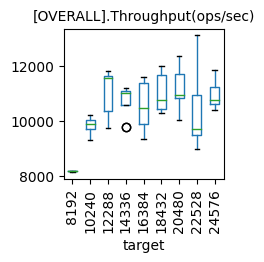

In [41]:
y = "[OVERALL].Throughput(ops/sec)"

plot_variation(df_groups, max_pod_count, y)
#ax = df_groups[df_groups['pod_count']==max_pod_count].boxplot(by='target', column=y, rot=90, figsize=(3,3), grid=False)
#ax.get_figure().suptitle('')

#### UPDATE

In [42]:
y='[UPDATE].99thPercentileLatency(us)'
plot_variation(df_groups, max_pod_count, y)

[UPDATE].99thPercentileLatency(us) not avalable


#### READ

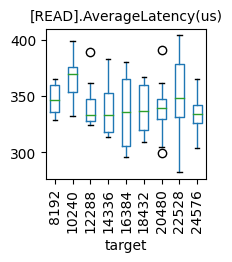

In [43]:
y='[READ].AverageLatency(us)'
plot_variation(df_groups, max_pod_count, y)

### Plot Comparison

#### Throughput

Text(0.5, 0, 'target (in $1000$s)')

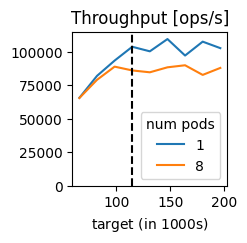

In [44]:
column = "pods"
x = "target"
y = "[OVERALL].Throughput(ops/sec)"
title = "Throughput [ops/s]"
ax=plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

import matplotlib.ticker as ticker
ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/1000))
ax.xaxis.set_major_formatter(ticks_x)
ax.set_xlabel("target (in $1000$s)")


#### UPDATE

In [45]:
column = "pods"
x = "target"
y = "[UPDATE].95thPercentileLatency(us)"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

[UPDATE].95thPercentileLatency(us) not avalable


In [46]:
column = "pods"
x = "target"
y = "[UPDATE].99thPercentileLatency(us)"
title = "99th Lat UPDATE [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

[UPDATE].99thPercentileLatency(us) not avalable


In [47]:
column = "pods"
x = "target"
y = "[UPDATE].AverageLatency(us)"
title = "Avg Lat UPDATE [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

[UPDATE].AverageLatency(us) not avalable


In [48]:
column = "pods"
x = "target"
y = "[UPDATE].MaxLatency(us)"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

[UPDATE].MaxLatency(us) not avalable


In [49]:
#column = ["threads", "pods"]
column = "pods"
x = "target"
y = "[UPDATE].99thPercentileLatency(us)"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

[UPDATE].99thPercentileLatency(us) not avalable


#### READ

<AxesSubplot: title={'center': '99th Lat READ [$\\mu$s]'}, xlabel='target'>

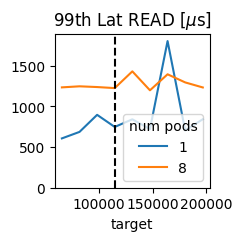

In [50]:
column = "pods"
x = "target"
y = "[READ].99thPercentileLatency(us)"
title = "99th Lat READ [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

Text(0.5, 0, 'target (in $1000$s)')

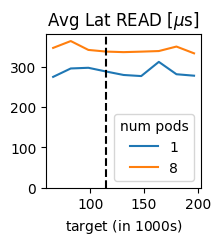

In [51]:
#column = ["threads", "pod_count"]
column = "pods"
x = "target"
y = "[READ].AverageLatency(us)"
title = "Avg Lat READ [$\mu$s]"
ax=plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)
ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/1000))
ax.xaxis.set_major_formatter(ticks_x)
ax.set_xlabel("target (in $1000$s)")


<AxesSubplot: title={'center': 'Avg Lat READ [$\\mu$s]'}, xlabel='target'>

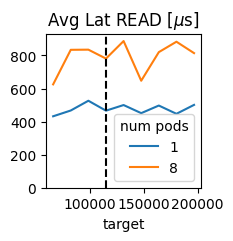

In [52]:
column = "pods"
x = "target"
y = "[READ].95thPercentileLatency(us)"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

#### INSERT

In [53]:
column = "pods"
x = "target"
y = "[INSERT].99thPercentileLatency(us)"
title = "99th Lat INSERT [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

[INSERT].99thPercentileLatency(us) not avalable


In [54]:
#column = ["threads", "pod_count"]
column = "pods"
x = "target"
y = "[INSERT].AverageLatency(us)"
title = "Avg Lat INSERT [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

[INSERT].AverageLatency(us) not avalable


In [55]:
column = "pods"
x = "target"
y = "[INSERT].95thPercentileLatency(us)"
title = "95th Lat INSERT [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

[INSERT].95thPercentileLatency(us) not avalable


#### SCAN

In [56]:
column = "pods"
x = "target"
y = "[SCAN].99thPercentileLatency(us)"
title = "99th Lat SCAN [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

[SCAN].99thPercentileLatency(us) not avalable


In [57]:
#column = ["threads", "pod_count"]
column = "pods"
x = "target"
y = "[SCAN].AverageLatency(us)"
title = "Avg Lat SCAN [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

[SCAN].AverageLatency(us) not avalable


In [58]:
column = "pods"
x = "target"
y = "[SCAN].95thPercentileLatency(us)"
title = "95th Lat SCAN [$\mu$s]"
plot_comparison(df_aggregated, x, y, column, title, peak_benchmark)

[SCAN].95thPercentileLatency(us) not avalable


# Show Infos about Connections

In [59]:
import ast

with open(path+"/"+code+"/connections.config",'r') as inf:
    connections = ast.literal_eval(inf.read())

print("found", len(connections), "connections")

found 18 connections


In [60]:
import json
#pretty_connections = json.dumps(connections, indent=2)

#print(pretty_connections)

## Loading Time per Number of Loading Threads

In [61]:
connections_sorted = sorted(connections, key=lambda c: c['name']) 

for c in connections_sorted:
    print(c['name'], 
          c['timeLoad'], 
          '[s] for', 
          c['parameter']['connection_parameter']['loading_parameters']['YCSB_THREADCOUNT'], 
          'threads on',
          c['hostsystem']['node'])

PostgreSQL-32-1-114688-1 1067.2299927175045 [s] for 32 threads on ip-192-168-92-229.eu-central-1.compute.internal
PostgreSQL-32-1-131072-1 1082.2905487641692 [s] for 32 threads on ip-192-168-92-229.eu-central-1.compute.internal
PostgreSQL-32-1-147456-1 1087.1068597659469 [s] for 32 threads on ip-192-168-92-229.eu-central-1.compute.internal
PostgreSQL-32-1-163840-1 1065.9665078893304 [s] for 32 threads on ip-192-168-92-229.eu-central-1.compute.internal
PostgreSQL-32-1-180224-1 1071.9870608896017 [s] for 32 threads on ip-192-168-92-229.eu-central-1.compute.internal
PostgreSQL-32-1-196608-1 1058.167465917766 [s] for 32 threads on ip-192-168-92-229.eu-central-1.compute.internal
PostgreSQL-32-1-65536-1 1069.2119839265943 [s] for 32 threads on ip-192-168-92-229.eu-central-1.compute.internal
PostgreSQL-32-1-81920-1 1055.2727652788162 [s] for 32 threads on ip-192-168-92-229.eu-central-1.compute.internal
PostgreSQL-32-1-98304-1 1070.3014538362622 [s] for 32 threads on ip-192-168-92-229.eu-centr

# Get monitoring metrics

## Loading


### Transform Monitoring Results to DataFrame

This has to be done only once. Transformed Results are stored in result folder.

We also show a list of available metrics.

In [62]:
evaluation.transform_monitoring_results(component="loading")

evaluation.get_monitoring_metrics()

['total_cpu_memory',
 'total_cpu_memory_cached',
 'total_cpu_util',
 'total_cpu_util_max',
 'total_cpu_throttled',
 'total_cpu_util_others',
 'total_cpu_util_s',
 'total_cpu_util_user_s',
 'total_cpu_util_sys_s',
 'total_cpu_throttled_s',
 'total_cpu_util_others_s',
 'total_network_rx',
 'total_network_tx',
 'total_fs_read',
 'total_fs_write',
 'total_gpu_util',
 'total_gpu_power',
 'total_gpu_memory']

### Plot all Metrics

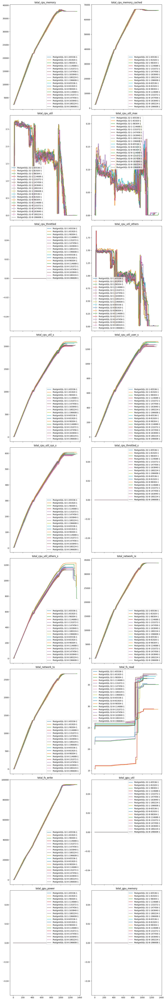

In [63]:
list_metrics = evaluation.get_monitoring_metrics()
row=0
col=0
rows = (len(list_metrics)+1)//2

fig, axes = plt.subplots(nrows=rows, ncols=2, sharex=True, squeeze=False, figsize=(12,8*rows))
for metric in list_metrics:
    df = evaluation.get_monitoring_metric(metric)
    ax = df.plot(ax=axes[row,col], kind='line', title=metric, layout=(rows,2))
    col = col + 1
    if col > 1:
        row = row + 1
        col = 0
plt.legend(loc='best')
plt.tight_layout()
plt.show()

### Plot some Aggregations

#### Compute Time

<AxesSubplot: title={'center': 'Compute Time'}, xlabel='target'>

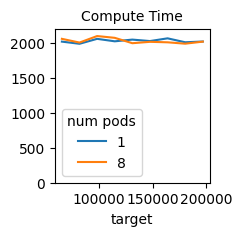

In [64]:
df = evaluation.get_monitoring_metric('total_cpu_util_s', component='loading').max() - evaluation.get_monitoring_metric('total_cpu_util_s', component='loading').min()
plot_metric(df, "Compute Time")

#### Maximum CPU Util

<AxesSubplot: title={'center': 'Max CPU'}, xlabel='target'>

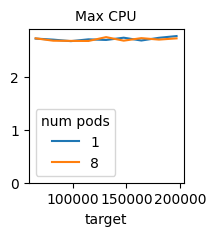

In [65]:
df = evaluation.get_monitoring_metric('total_cpu_util', component='loading').max()
plot_metric(df, "Max CPU")
#df.plot.bar()

#### Maximum Util of a CPU Core

<AxesSubplot: title={'center': 'Max CPU Core [%]'}, xlabel='target'>

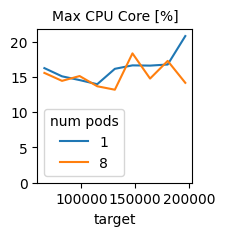

In [66]:
df = evaluation.get_monitoring_metric('total_cpu_util_max', component='loading').max()*100
plot_metric(df, "Max CPU Core [%]")

#### Maxmimum RAM

<AxesSubplot: title={'center': 'Max RAM [Gb]'}, xlabel='target'>

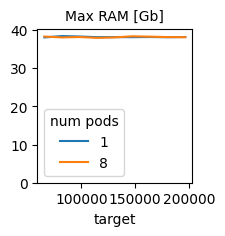

In [67]:
df = evaluation.get_monitoring_metric('total_cpu_memory', component='loading').max()/1000
plot_metric(df, "Max RAM [Gb]")

#### Maxmimum Cache

<AxesSubplot: title={'center': 'Max Cache [Gb]'}, xlabel='target'>

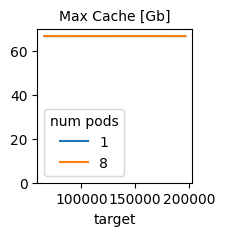

In [68]:
df = evaluation.get_monitoring_metric('total_cpu_memory_cached', component='loading').max()/1000
plot_metric(df, "Max Cache [Gb]")

## Loader Driver

### Transform Monitoring Results to DataFrame

This has to be done only once. Transformed Results are stored in result folder.

We also show a list of available metrics.


In [69]:
evaluation.transform_monitoring_results(component='loader')

evaluation.get_monitoring_metrics()

['total_cpu_memory',
 'total_cpu_memory_cached',
 'total_cpu_util',
 'total_cpu_util_max',
 'total_cpu_throttled',
 'total_cpu_util_others',
 'total_cpu_util_s',
 'total_cpu_util_user_s',
 'total_cpu_util_sys_s',
 'total_cpu_throttled_s',
 'total_cpu_util_others_s',
 'total_network_rx',
 'total_network_tx',
 'total_fs_read',
 'total_fs_write',
 'total_gpu_util',
 'total_gpu_power',
 'total_gpu_memory']

### Plot all Metrics

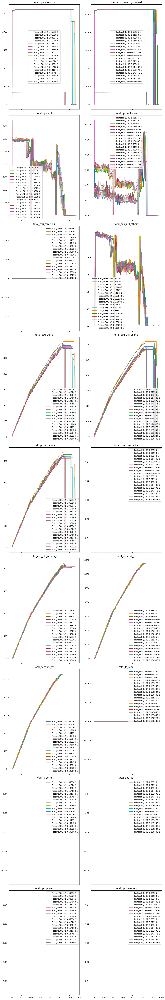

In [70]:
list_metrics = evaluation.get_monitoring_metrics()
row=0
col=0
rows = (len(list_metrics)+1)//2

fig, axes = plt.subplots(nrows=rows, ncols=2, sharex=True, squeeze=False, figsize=(12,8*rows))
for metric in list_metrics:
    df = evaluation.get_monitoring_metric(metric, component='loader')
    #if df.sum().sum() > 0:
    ax = df.plot(ax=axes[row,col], kind='line', title=metric, layout=(rows,2))
    col = col + 1
    if col > 1:
        row = row + 1
        col = 0
plt.legend(loc='best')
plt.tight_layout()
plt.show()

### Plot some Aggregations

#### Compute Time

<AxesSubplot: title={'center': 'Compute Time'}, xlabel='target'>

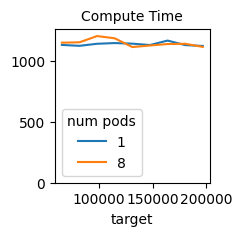

In [71]:
df = evaluation.get_monitoring_metric('total_cpu_util_s', component='loader').max() - evaluation.get_monitoring_metric('total_cpu_util_s', component='loader').min()
plot_metric(df, "Compute Time")

#### Maxmimum CPU Util

<AxesSubplot: title={'center': 'Max CPU'}, xlabel='target'>

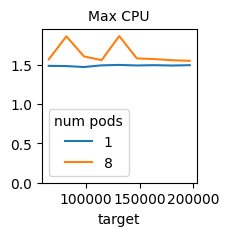

In [72]:
df = evaluation.get_monitoring_metric('total_cpu_util', component='loader').max()
plot_metric(df, "Max CPU")

#### Maximum Util of a CPU Core

<AxesSubplot: title={'center': 'Max CPU Core [%]'}, xlabel='target'>

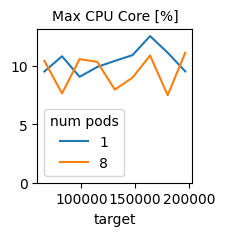

In [73]:
df = evaluation.get_monitoring_metric('total_cpu_util_max', component='loader').max()*100
plot_metric(df, "Max CPU Core [%]")

#### Maximum RAM

<AxesSubplot: title={'center': 'Max RAM [Gb]'}, xlabel='target'>

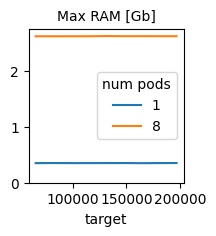

In [74]:
df = evaluation.get_monitoring_metric('total_cpu_memory', component='loader').max()/1000
plot_metric(df, "Max RAM [Gb]")

#### Maximum Cache

<AxesSubplot: title={'center': 'Max Cache'}, xlabel='target'>

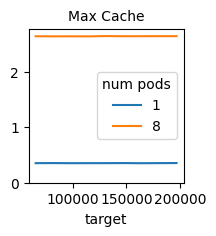

In [75]:
df = evaluation.get_monitoring_metric('total_cpu_memory_cached', component='loader').max()/1000
plot_metric(df, "Max Cache")

## Benchmarking

### Transform Monitoring Results to DataFrame

This has to be done only once. Transformed Results are stored in result folder.

We also show a list of available metrics.


In [76]:
evaluation.transform_monitoring_results(component='stream')

evaluation.get_monitoring_metrics()

['total_cpu_memory',
 'total_cpu_memory_cached',
 'total_cpu_util',
 'total_cpu_util_max',
 'total_cpu_throttled',
 'total_cpu_util_others',
 'total_cpu_util_s',
 'total_cpu_util_user_s',
 'total_cpu_util_sys_s',
 'total_cpu_throttled_s',
 'total_cpu_util_others_s',
 'total_network_rx',
 'total_network_tx',
 'total_fs_read',
 'total_fs_write',
 'total_gpu_util',
 'total_gpu_power',
 'total_gpu_memory']

### Plot all Metrics

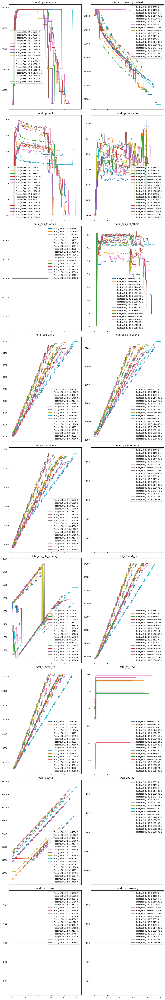

In [77]:
list_metrics = evaluation.get_monitoring_metrics()
row=0
col=0
rows = (len(list_metrics)+1)//2

fig, axes = plt.subplots(nrows=rows, ncols=2, sharex=True, squeeze=False, figsize=(12,8*rows))
for metric in list_metrics:
    df = evaluation.get_monitoring_metric(metric, component='stream')
    #if df.sum().sum() > 0:
    ax = df.plot(ax=axes[row,col], kind='line', title=metric, layout=(rows,2))
    col = col + 1
    if col > 1:
        row = row + 1
        col = 0
plt.legend(loc='best')
plt.tight_layout()
plt.show()

### Plot some Aggregations

#### Compute Time

Text(0.5, 0, 'target (in $1000$s)')

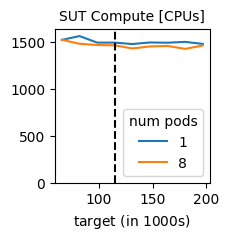

In [78]:
df = evaluation.get_monitoring_metric('total_cpu_util_s', component='stream').max() - evaluation.get_monitoring_metric('total_cpu_util_s', component='stream').min()
ax=plot_metric(df, "SUT Compute [CPUs]", peak_benchmark)
df
ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/1000))
ax.xaxis.set_major_formatter(ticks_x)
ax.set_xlabel("target (in $1000$s)")


#### Maximum CPU Util

Text(0.5, 0, 'target (in $1000$s)')

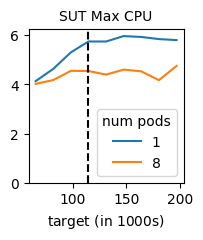

In [79]:
df = evaluation.get_monitoring_metric('total_cpu_util', component='stream').max()
ax=plot_metric(df, "SUT Max CPU", peak_benchmark)
df
ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/1000))
ax.xaxis.set_major_formatter(ticks_x)
ax.set_xlabel("target (in $1000$s)")


#### Maximum Util of a CPU Core

<AxesSubplot: title={'center': 'SUT Max CPU Core [%]'}, xlabel='target'>

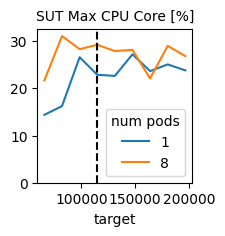

In [80]:
df = evaluation.get_monitoring_metric('total_cpu_util_max', component='stream').max()*100
plot_metric(df, "SUT Max CPU Core [%]", peak_benchmark)

#### Maximum RAM

<AxesSubplot: title={'center': 'SUT Max RAM'}, xlabel='target'>

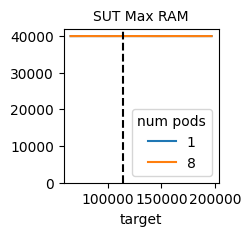

In [81]:
df = evaluation.get_monitoring_metric('total_cpu_memory', component='stream').max()
plot_metric(df, "SUT Max RAM", peak_benchmark)

#### Maximum Cache

<AxesSubplot: title={'center': 'SUT Max Cache'}, xlabel='target'>

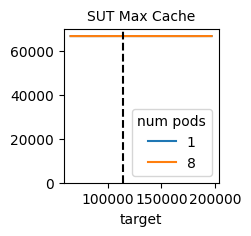

In [82]:
df = evaluation.get_monitoring_metric('total_cpu_memory_cached', component='stream').max()
plot_metric(df, "SUT Max Cache", peak_benchmark)

## Benchmarker Driver

### Transform Monitoring Results to DataFrame

This has to be done only once. Transformed Results are stored in result folder.

We also show a list of available metrics.

In [83]:
evaluation.transform_monitoring_results(component='benchmarker')

evaluation.get_monitoring_metrics()

['total_cpu_memory',
 'total_cpu_memory_cached',
 'total_cpu_util',
 'total_cpu_util_max',
 'total_cpu_throttled',
 'total_cpu_util_others',
 'total_cpu_util_s',
 'total_cpu_util_user_s',
 'total_cpu_util_sys_s',
 'total_cpu_throttled_s',
 'total_cpu_util_others_s',
 'total_network_rx',
 'total_network_tx',
 'total_fs_read',
 'total_fs_write',
 'total_gpu_util',
 'total_gpu_power',
 'total_gpu_memory']

### Plot all Metrics

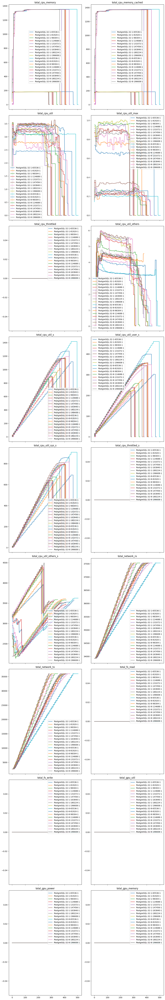

In [84]:
list_metrics = evaluation.get_monitoring_metrics()
row=0
col=0
rows = (len(list_metrics)+1)//2

fig, axes = plt.subplots(nrows=rows, ncols=2, sharex=True, squeeze=False, figsize=(12,8*rows))
for metric in list_metrics:
    df = evaluation.get_monitoring_metric(metric, component='benchmarker')
    #if df.sum().sum() > 0:
    ax = df.plot(ax=axes[row,col], kind='line', title=metric, layout=(rows,2))
    col = col + 1
    if col > 1:
        row = row + 1
        col = 0
plt.legend(loc='best')
plt.tight_layout()
plt.show()

### Plot some Aggregations

#### Compute Time

<AxesSubplot: title={'center': 'Compute Time'}, xlabel='target'>

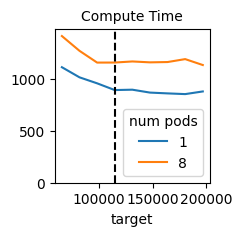

In [85]:
df = evaluation.get_monitoring_metric('total_cpu_util_s', component='benchmarker').max() - evaluation.get_monitoring_metric('total_cpu_util_s', component='benchmarker').min()
plot_metric(df, "Compute Time", peak_benchmark)

<AxesSubplot: title={'center': 'Driver compute [CPUs]'}, xlabel='target'>

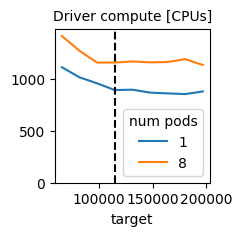

In [86]:
df = evaluation.get_monitoring_metric('total_cpu_util_s', component='benchmarker').max() - evaluation.get_monitoring_metric('total_cpu_util_s', component='benchmarker').min()
plot_metric(df, "Driver compute [CPUs]", peak_benchmark)

#### Maximum CPU Util

<AxesSubplot: title={'center': 'Driver max CPU'}, xlabel='target'>

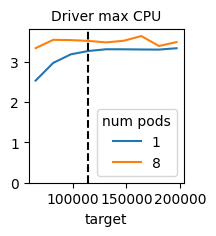

In [87]:
df = evaluation.get_monitoring_metric('total_cpu_util', component='benchmarker').max()
plot_metric(df, "Driver max CPU", peak_benchmark)

#### Maximum Util of a CPU Core

<AxesSubplot: title={'center': 'Driver max CPU Core [%]'}, xlabel='target'>

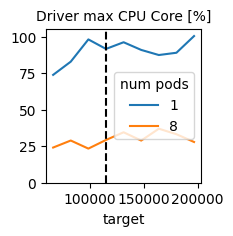

In [88]:
df = evaluation.get_monitoring_metric('total_cpu_util_max', component='benchmarker').max()*100
plot_metric(df, "Driver max CPU Core [%]", peak_benchmark)

#### Maximum RAM

<AxesSubplot: title={'center': 'Max RAM [Gb]'}, xlabel='target'>

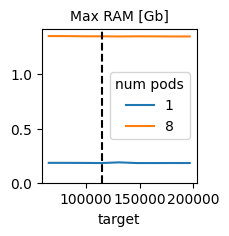

In [89]:
df = evaluation.get_monitoring_metric('total_cpu_memory', component='benchmarker').max()/1000
plot_metric(df, "Max RAM [Gb]", peak_benchmark)

#### Maximum Cache

<AxesSubplot: title={'center': 'Max Cache [Gb]'}, xlabel='target'>

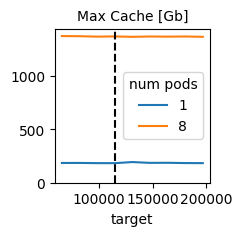

In [90]:
df = evaluation.get_monitoring_metric('total_cpu_memory_cached', component='benchmarker').max()
plot_metric(df, "Max Cache [Gb]", peak_benchmark)